# Distribution of branch lengths conditioned on selection on a derived variant

In [2]:
#library(plotly)
library(ggplot2)
library(viridis)
library(grid)
library(gridExtra)
library("IRdisplay")
library(repr)
options(repr.plot.width=8, repr.plot.height=5.5)

Indlæser krævet pakke: viridisLite



R header:

In [3]:
library(tidyverse)
library(devtools)
#remove.packages("ptdalgorithms")
# devtools::install_github("TobiasRoikjer/PtDAlgorithms")
library(ptdalgorithms)

── Attaching core tidyverse packages ──────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.2     ✔ tibble    3.2.1
✔ purrr     1.0.1     ✔ tidyr     1.3.0
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::combine() masks gridExtra::combine()
✖ dplyr::filter()  masks stats::filter()
✖ dplyr::lag()     masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Indlæser krævet pakke: usethis



In [4]:
# remove.packages("ptdalgorithms")

In [5]:
# install.packages("remotes")
# remotes::install_github("Thell/RcppMP")

In [6]:
# # GNUMPLIB
# ./configure --prefix=$CONDA_PREFIX --enable-cxx


In [7]:
# !export LIBS="-L/Users/kmt/miniconda3/envs/phasetype/lib"
# !export CPPFLAGS="-I/Users/kmt/miniconda3/envs/phasetype/include"

In [8]:
source("plot_functions.R")

In [9]:
theme_set(theme_bw())

despine <- theme(panel.border = element_blank(), panel.grid.major = element_blank(),
panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"),
                text=element_text(family="Arial"))

In [10]:
# p <- ggplot(data=iris, aes(x = Sepal.Length, y = Sepal.Width)) +
#       geom_point(aes(color=Species, shape=Species)) + despine

# ggplotly(width=600, height=400)

In [11]:
despine <- theme(panel.border = element_blank(), panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"),
                text=element_text(size=17)) 

options(repr.plot.width=10, repr.plot.height=7)

# ggplot(data=iris, aes(x = Sepal.Length, y = Sepal.Width)) +
#       geom_point(aes(color=Species, shape=Species), size=5, alpha=0.5) + scale_color_brewer(palette="Set1") + despine

## Utility functions

In [12]:
state_legend <- function(graph) {

    mat <- graph_as_matrix(graph)

    cat('state\t\t\ttons (anc/der)\t\tfreq bin', '\n')
    
    cat('\t\t', paste(seq(1:(sample_size-1)), collapse='\t'), '\n', sep='\t')
    
    for (s in 1:nrow(mat$states)) {
        nr_anc_tons <- integer(sample_size-1)
        nr_der_tons <- integer(sample_size-1)
        for (i in 1:ncol(mat$states)) {
            props <- index_to_props(sample_size, i)
            if (props$n_descendants > 0) {
                if (props$is_derived == 1) {
                    nr_der_tons[props$n_descendants] <- mat$states[s, i] + nr_der_tons[props$n_descendants]
                } else {
                    nr_anc_tons[props$n_descendants] <- mat$states[s, i] + nr_anc_tons[props$n_descendants]
                }
            }
        }
        cat(paste(mat$states[s, ], collapse=','), '\t')
        for (i in 1:(sample_size-1)) {
            cat(nr_der_tons[i], "/", nr_anc_tons[i], sep='')
            cat('\t')
        }
        cat(mat$states[s, length(mat$states[s, ])])
        cat('\n')
    }
}

## Coalescent with selection in C++ 

In [13]:
Rcpp::sourceCpp("./cpp/coalescent.cpp")

## Sanity checks

In [14]:
n <- 2
d <- 1
N <- 5
n_freqbins <- NA
s <- 0.0
graph <- construct_coalescent_selection_graph(n, d, N, n_freqbins, s)
expectation(graph)

[1] 3.462674

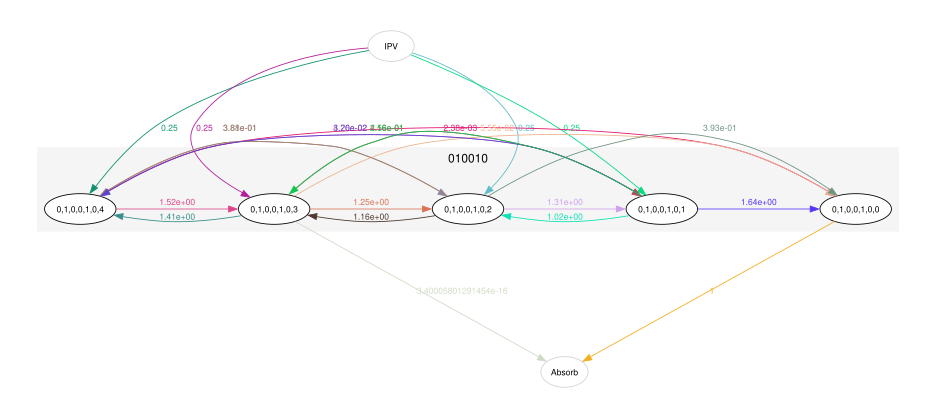

In [15]:
gam <- graph_as_matrix(graph)
plot_graph(gam, subgraphs=TRUE, 
           rainbow=TRUE,
           subgraphfun=function(state) paste(state[-length(state)], collapse=""), 
           # subgraphfun=function(state) paste(state[length(state)], collapse=""), 
           size=c(13, 13), 
           rankdir="TB", 
           align=TRUE)
#plot_graph(gam, subgraphs=TRUE, size=c(8, 8))

### Single ancestral, single derived

With $n=2$ and $d=1$, the expectation must be 2: 1 (the coal time of all derived, which make up half the population, so 2/2) + 1 (the coal time of two ancestral sequences in a population of all ancestral):

$$ N + \mu \rightarrow 1 + \mu/N = 1 + 1 = 2 $$

The two rates are $\frac{1}{N}$ and $\mu$. Scaled they are 1 and $N\mu$. So the total expectation is $1 + 1/Nu$. Since we have sampled one derived and one ancestral. So the mean of the prior freq is 0.5, which imply that the prior on $N\mu$ is 1 because our single observation produce the expectation that for two randomly sampled individuals, a mutation happens on one of the two branches with probability one, producing a pairwise diversity of $2N\mu = 0.5$ so $N\mu = 1$.

In [16]:
n <- 2
d <- 1
N <- 1000
n_freqbins <- NA
s <- 0.0
graph <- construct_coalescent_selection_graph(n, d, N, n_freqbins, s)
expectation(graph)

[1] 2.004241

### Many ancestral, single derived

With very large $n$ and $d=1$, the expectation converges to the total tree height ($2N$ for haploid, I.e. 2), with the small extra waiting time as the mean of the prior on $N\mu$ is:

$$2N\mu = \frac{n}{n\choose2} = \frac{n(n-1)}{2} = \frac{2}{n-1} \rightarrow N\mu = \frac{1}{n-1} $$

So the expectation should be $2 \frac{1}{n-1}$, which for $n=20$ and $d=1$ would be $\approx 2.05263$:

In [17]:
sample_size <- 20
n_derived <- 1
pop_size <- 100
n_freqbins <- NA
sel_coef <- 0.0
graph <- construct_coalescent_selection_graph(sample_size, n_derived, pop_size, n_freqbins, sel_coef)
expectation(graph)

[1] 2.07861

### Many ancestral, single derived vs. a many derived, single ancestral

The following two should have the same expectation:

In [19]:
sample_size <- 3
n_derived <- 2
pop_size <- 500
n_freqbins <- NA
sel_coef <- 0.0
graph <- construct_coalescent_selection_graph(sample_size, n_derived, pop_size, n_freqbins, sel_coef)
expectation(graph)

[1] 2.450912

In [20]:
sample_size <- 3
n_derived <- 2
graph <- construct_coalescent_selection_graph(sample_size, n_derived, pop_size, n_freqbins, sel_coef)
expectation(graph)

[1] 2.450912

### Two derived and two ancestral

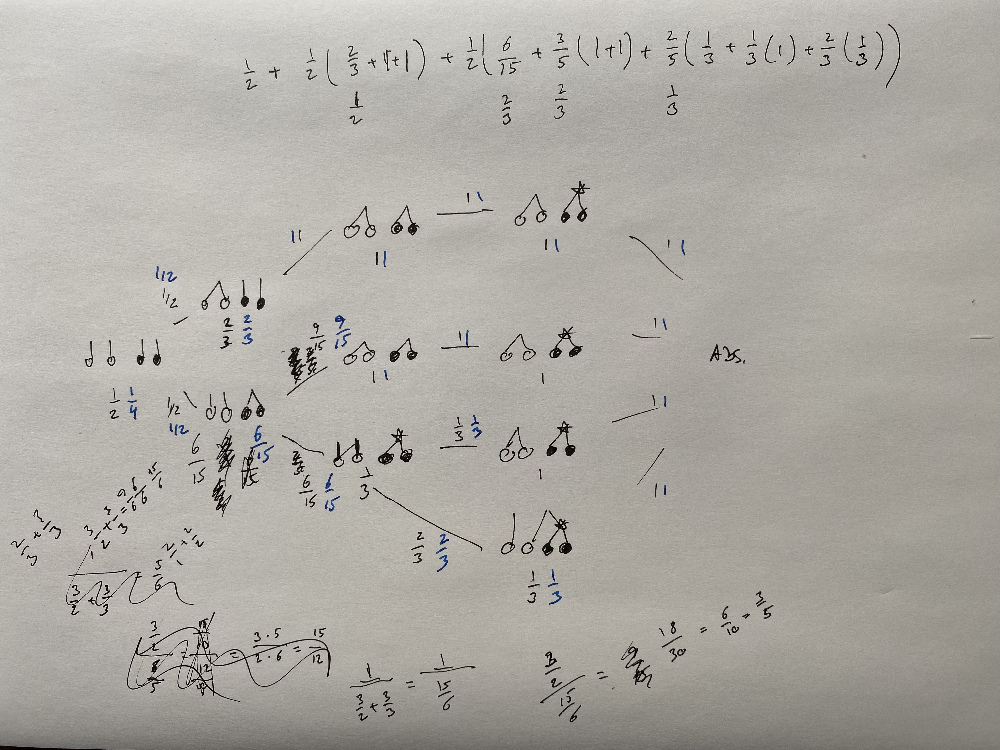

In [21]:
1/4 + 1/2*(2/3 + 1 + 1) + 1/2*(6/15 + 6/15*(1+1) + 9/15*(1/3 + 1/3*(1) + 2/3*(1/3)))

[1] 2.45

In [22]:
sample_size <- 4
n_derived <- 2
pop_size <- 500
n_freqbins <- NA
sel_coef <- 0.0
graph <- construct_coalescent_selection_graph(sample_size, n_derived, pop_size, n_freqbins, sel_coef)
expectation(graph)

[1] 2.474141

In [25]:
gam <- graph_as_matrix(graph)
gam

$states
     [,1] [,2] [,3] [,4] [,5] [,6] [,7]
[1,]    0    1    0    0    1    0    4
[2,]    0    1    0    0    1    0    3
[3,]    0    1    0    0    1    0    2
[4,]    0    1    0    0    1    0    1
[5,]    0    1    0    0    1    0    0

$SIM
            [,1]      [,2]       [,3]        [,4]         [,5]
[1,] -1.95383148  1.523084  0.3807711  0.04759638  0.002379819
[2,]  1.40527409 -3.126301  1.2491325  0.41637751  0.055517001
[3,]  0.38797285  1.163919 -3.2541223  1.30940837  0.392822510
[4,]  0.03201024  0.256082  1.0243278 -2.95134448  1.638924484
[5,]  0.00000000  0.000000  0.0000000  0.00000000 -1.000000000

$IPV
[1] 0.25 0.25 0.25 0.25 0.00

$indices
[1] 6 5 4 3 2

In [28]:
rowSums(gam$SIM)

[1] -3.469447e-17 -6.938894e-17  2.775558e-16 -4.440892e-16 -1.000000e+00

In [29]:
state_legend(graph)

state			tons (anc/der)		freq bin 
			1	2	3	
0,2,0,0,0,0,2,0,0,0,0 	2/2	0/0	0/0	0
0,2,0,0,0,0,2,0,0,0,2 	2/2	0/0	0/0	2
0,0,1,0,0,0,2,0,0,0,0 	2/0	0/1	0/0	0
0,2,0,0,0,0,2,0,0,0,1 	2/2	0/0	0/0	1
0,0,1,0,0,0,2,0,0,0,2 	2/0	0/1	0/0	2
0,2,0,0,0,0,0,1,0,0,2 	0/2	1/0	0/0	2
0,0,1,0,0,0,2,0,0,0,1 	2/0	0/1	0/0	1
0,2,0,0,0,0,0,1,0,0,0 	0/2	1/0	0/0	0
0,2,0,0,0,0,0,1,0,0,1 	0/2	1/0	0/0	1
0,0,1,0,0,0,0,1,0,0,2 	0/0	1/1	0/0	2
0,1,0,1,0,0,0,0,0,0,2 	0/1	0/0	0/1	2
0,0,1,0,0,0,0,1,0,0,0 	0/0	1/1	0/0	0
0,0,1,0,0,0,0,1,0,0,1 	0/0	1/1	0/0	1
0,1,0,1,0,0,0,0,0,0,1 	0/1	0/0	0/1	1
0,1,0,1,0,0,0,0,0,0,0 	0/1	0/0	0/1	0


# I don't think this is correct. the frist coal rates are 1/2 not 1/6. this produces 

In [91]:
((1/2 + 1/3 + 1) + (1/2 + 1/2 + 1))/2

[1] 1.916667

In [96]:
1 + 11/12

[1] 1.916667

In [99]:
((1/2 + 1/6 + 1/2) + (1/2 + 1/2 + 1))/2

[1] 1.583333

# but the derived freq is 0.5 so the coal rate should be double for to begin width. sometihng more like:

In [27]:
((1/4 + 1/3 + 1) + (1/4 + 1/4 + 1))/2

[1] 1.541667

# the problem it that the def freq is not forced to zero, makeing the der freqs as large as they should be. i think that is solved by only allowing coalescence between anc and der after the def freq has been fixed at zero (where coal rate is 1)

## Standard coalescent

If you already have the subintensity matrix and initial probability vector:

In [33]:
sim = matrix(c(-6, 6, 0, 0, 
               0, -3, 1, 2,
               0, 0, -1, 0,
               0, 0, 0, -1), nrow=4, ncol=4, byrow = TRUE)
ipv = c(1, 0, 0, 0)
sim

-6,6,0,0
0,-3,1,2
0,0,-1,0
0,0,0,-1


In [34]:
graph <- matrix_as_graph(ipv, sim)

**NB:** the state vectors are ofcause undefined (all zero) when constructing the graph this way:

In [35]:
gam <- graph_as_matrix(graph)
gam

$states
     [,1]
[1,]    0
[2,]    0
[3,]    0
[4,]    0

$SIM
     [,1] [,2] [,3] [,4]
[1,]   -6    6    0    0
[2,]    0   -3    1    2
[3,]    0    0   -1    0
[4,]    0    0    0   -1

$IPV
[1] 1 0 0 0

$indices
[1] 2 3 4 5